<a href="https://colab.research.google.com/github/lawantha/BirdCLEF24/blob/main/birdcleff1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [7]:
!pip install librosa tensorflow scikit-learn


In [8]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"lawanthabandara","key":"8ea2c91cad6072364f5a81ea4c9ed67b"}'}

In [9]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [10]:
!kaggle competitions download -c birdclef-2024


  2% 493M/21.8G [00:04<03:06, 122MB/s]
User cancelled operation


In [ ]:
!unzip birdclef-2024.zip -d birdclef_data


Streaming output truncated to the last 5000 lines.
  inflating: birdclef_data/unlabeled_soundscapes/179981235.ogg  
  inflating: birdclef_data/unlabeled_soundscapes/1800082794.ogg  
  inflating: birdclef_data/unlabeled_soundscapes/1800832559.ogg  
  inflating: birdclef_data/unlabeled_soundscapes/1800923622.ogg  
  inflating: birdclef_data/unlabeled_soundscapes/1801340995.ogg  
  inflating: birdclef_data/unlabeled_soundscapes/1801365905.ogg  
  inflating: birdclef_data/unlabeled_soundscapes/1801959695.ogg  
  inflating: birdclef_data/unlabeled_soundscapes/1802029440.ogg  
  inflating: birdclef_data/unlabeled_soundscapes/1802100563.ogg  
  inflating: birdclef_data/unlabeled_soundscapes/1802118433.ogg  
  inflating: birdclef_data/unlabeled_soundscapes/1802137115.ogg  
  inflating: birdclef_data/unlabeled_soundscapes/1802619996.ogg  
  inflating: birdclef_data/unlabeled_soundscapes/1803065385.ogg  
  inflating: birdclef_data/unlabeled_soundscapes/180321934.ogg  
  inflating: birdclef_data/

In [2]:
!pip install pydub
!apt-get install ffmpeg

import os
from pydub import AudioSegment
import pandas as pd

import IPython.display as ipd
import matplotlib.pyplot as plt
import librosa
import librosa.display as lid
import numpy as np

import tensorflow as tf

import matplotlib.pyplot as plt

ModuleNotFoundError: No module named 'pydub'

In [11]:
import os

# List all files in the dataset directory
birdclef_data_dir = '/content/drive/MyDrive/western_ghats_1'
files = os.listdir(birdclef_data_dir)
print(files)


['train_metadata.csv', 'train_audio']


In [3]:
!pip install pydub
!apt-get install ffmpeg


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


In [8]:
from pydub import AudioSegment
from IPython.display import Audio, display

def convert_ogg_to_wav(ogg_path, wav_path):
    # Load the .ogg file
    audio = AudioSegment.from_ogg(ogg_path)
    # Export the audio to .wav format
    audio.export(wav_path, format="wav")

# Example usage
ogg_file = '/content/drive/MyDrive/western_ghats_1/train_audio/bkcbul1/XC448142.ogg'
wav_file = ogg_file.replace('.ogg', '.wav')
convert_ogg_to_wav(ogg_file, wav_file)

print(f"Converted {ogg_file} to {wav_file}")

# Display the audio
display(Audio(wav_file))

Converted /content/drive/MyDrive/western_ghats_1/train_audio/bkcbul1/XC448142.ogg to /content/drive/MyDrive/western_ghats_1/train_audio/bkcbul1/XC448142.wav


Filter out data which has record around western ghats 📍

In [15]:
class CFG:
    seed = 42

    # Input image size and batch size
    img_size = [128, 384]
    batch_size = 64

    # Audio duration, sample rate, and length
    duration = 15 # second
    sample_rate = 32000
    audio_len = duration*sample_rate

    # STFT parameters
    nfft = 2028
    window = 2048
    hop_length = audio_len // (img_size[1] - 1)
    fmin = 20
    fmax = 16000

    # Number of epochs, model name
    epochs = 10
    preset = 'efficientnetv2_b2_imagenet'

    # Data augmentation parameters
    augment=True

    # Class Labels for BirdCLEF 24
    class_names = sorted(os.listdir(birdclef_data_dir + '/train_audio/'))
    num_classes = len(class_names)
    class_labels = list(range(num_classes))
    label2name = dict(zip(class_labels, class_names))
    name2label = {v:k for k,v in label2name.items()}

In [16]:
import pandas as pd

df = pd.read_csv(f'{birdclef_data_dir}/train_metadata.csv')
df['filepath'] = birdclef_data_dir + '/train_audio/' + df.filename
df['target'] = df.primary_label.map(CFG.name2label)
df['filename'] = df.filepath.map(lambda x: x.split('/')[-1])
df['xc_id'] = df.filepath.map(lambda x: x.split('/')[-1].split('.')[0])

# Display rwos
df.head(2)

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,filename,filepath,target,xc_id
0,asbfly,[],['call'],15.5442,73.7733,Muscicapa dauurica,Asian Brown Flycatcher,Albert Lastukhin & Sergei Karpeev,Creative Commons Attribution-NonCommercial-Sha...,4.0,XC209218.ogg,/content/drive/MyDrive/western_ghats_1/train_a...,0,XC209218
1,asbfly,[],['call'],15.5442,73.7733,Muscicapa dauurica,Asian Brown Flycatcher,Albert Lastukhin & Sergei Karpeev,Creative Commons Attribution-NonCommercial-Sha...,4.0,XC209219.ogg,/content/drive/MyDrive/western_ghats_1/train_a...,0,XC209219


**To df filter out data sets around wetern ghast**

In [ ]:
import os
import shutil

# Define the latitude and longitude range for the Western Ghats
western_ghats_latitude_min = 8.0
western_ghats_latitude_max = 21.0
western_ghats_longitude_min = 73.0
western_ghats_longitude_max = 78.0

# Filter the DataFrame to include only records within the Western Ghats range
western_ghats_df = df[
    (df['latitude'] >= western_ghats_latitude_min) &
    (df['latitude'] <= western_ghats_latitude_max) &
    (df['longitude'] >= western_ghats_longitude_min) &
    (df['longitude'] <= western_ghats_longitude_max)
]

# Check the filtered DataFrame
print(western_ghats_df.head())


    primary_label secondary_labels      type  latitude  longitude  \
4          asbfly               []  ['call']   15.5442    73.7733   
5          asbfly               []  ['call']   15.5442    73.7733   
11         asbfly               []  ['call']   10.1653    76.5476   
32         asbfly               []  ['call']   10.3526    77.5744   
116       ashdro1               []  ['call']   18.8897    73.1232   

          scientific_name             common_name  \
4      Muscicapa dauurica  Asian Brown Flycatcher   
5      Muscicapa dauurica  Asian Brown Flycatcher   
11     Muscicapa dauurica  Asian Brown Flycatcher   
32     Muscicapa dauurica  Asian Brown Flycatcher   
116  Dicrurus leucophaeus             Ashy Drongo   

                                author  \
4    Albert Lastukhin & Sergei Karpeev   
5    Albert Lastukhin & Sergei Karpeev   
11                            Dilip KG   
32                         Viral joshi   
116                     Saurabh Sawant   

             

In [ ]:
# Extract the file paths of the filtered audio files
# filtered_audio_files = western_ghats_df['filepath'].apply(lambda x: x.replace('.ogg', '.wav')).tolist()

# Extract the file paths of the filtered audio files (in .ogg format)
filtered_audio_files = western_ghats_df['filepath'].tolist()

# Print the list of filtered audio files
for file in filtered_audio_files:
    print(file)

birdclef_data/train_audio/asbfly/XC209218.ogg
birdclef_data/train_audio/asbfly/XC209219.ogg
birdclef_data/train_audio/asbfly/XC291450.ogg
birdclef_data/train_audio/asbfly/XC453302.ogg
birdclef_data/train_audio/ashdro1/XC120586.ogg
birdclef_data/train_audio/ashdro1/XC214278.ogg
birdclef_data/train_audio/ashdro1/XC289070.ogg
birdclef_data/train_audio/ashdro1/XC308273.ogg
birdclef_data/train_audio/ashdro1/XC37742.ogg
birdclef_data/train_audio/ashdro1/XC429763.ogg
birdclef_data/train_audio/ashdro1/XC574750.ogg
birdclef_data/train_audio/ashpri1/XC195760.ogg
birdclef_data/train_audio/ashpri1/XC197604.ogg
birdclef_data/train_audio/ashpri1/XC214126.ogg
birdclef_data/train_audio/ashpri1/XC239261.ogg
birdclef_data/train_audio/ashpri1/XC276715.ogg
birdclef_data/train_audio/ashpri1/XC277294.ogg
birdclef_data/train_audio/ashpri1/XC306464.ogg
birdclef_data/train_audio/ashpri1/XC310857.ogg
birdclef_data/train_audio/ashpri1/XC322644.ogg
birdclef_data/train_audio/ashpri1/XC346524.ogg
birdclef_data/trai

In [ ]:
# import os
# import shutil

# # Define the destination directory for the filtered audio files
# destination_dir = '/content/western_ghats/train_audio/'
# # destination_dir = '/content/drive/MyDrive/western_ghats_train_audio'

# # Create the destination directory if it doesn't exist
# os.makedirs(destination_dir, exist_ok=True)

# # Copy the filtered audio files to species-specific subdirectories
# for index, row in western_ghats_df.iterrows():
#     # Extract the species name (primary label) and the filepath
#     species_name = row['primary_label']
#     file_path = row['filepath']

#     # Extract the filename from the full file path
#     filename = os.path.basename(file_path)

#     # Define the species-specific directory path
#     species_dir = os.path.join(destination_dir, species_name)

#     # Create the species-specific directory if it doesn't exist
#     os.makedirs(species_dir, exist_ok=True)

#     # Define the destination file path
#     destination_path = os.path.join(species_dir, filename)

#     # Copy the file to the species-specific directory
#     shutil.copy(file_path, destination_path)

#     # Optionally, you can move the file instead of copying:
#     # shutil.move(file_path, destination_path)

# print("Files have been copied to species-specific directories.")


Files have been copied to species-specific directories.


In [ ]:
# import shutil
# import os

# # Define the directory to be deleted
# directory_to_delete = '/content/western_ghats/'

# # Check if the directory exists
# if os.path.exists(directory_to_delete):
#     # Delete the directory and all its contents
#     shutil.rmtree(directory_to_delete)
#     print(f"Directory '{directory_to_delete}' and all its contents have been deleted.")
# else:
#     print(f"Directory '{directory_to_delete}' does not exist.")

Directory '/content/western_ghats/' and all its contents have been deleted.


In [ ]:
# import shutil
# import os

# # Define the source and destination paths
# source_dir = '/content/western_ghats_train_audio/'
# destination_dir = '/content/western_ghats/western_ghats_train_audio/'

# # Create the destination parent directory if it doesn't exist
# os.makedirs(os.path.dirname(destination_dir), exist_ok=True)

# # Move the directory
# shutil.move(source_dir, destination_dir)

# print(f"Directory '{source_dir}' has been moved to '{destination_dir}'.")

In [ ]:
# import shutil
# import os

# # Define the source and destination paths
# source_dir = '/content/western_ghats'
# destination_dir = '/content/drive/MyDrive/western_ghats'

# # Create the destination parent directory if it doesn't exist
# os.makedirs(os.path.dirname(destination_dir), exist_ok=True)

# # Copy the directory
# shutil.copytree(source_dir, destination_dir)

# print(f"Directory '{source_dir}' has been copied to '{destination_dir}'.")

In [ ]:
# # Step 1: Filter the DataFrame (already done)
# # western_ghats_df contains the filtered data

# # Step 2: Count the unique bird species in the filtered data
# unique_species_count = western_ghats_df['primary_label'].nunique()

# # Get the unique species names as well
# unique_species_names = western_ghats_df['primary_label'].unique()

# # Display the results
# print(f"Number of unique bird species in the filtered data: {unique_species_count}")
# print(f"Unique bird species: {unique_species_names}")

Number of unique bird species in the filtered data: 163
Unique bird species: ['asbfly' 'ashdro1' 'ashpri1' 'ashwoo2' 'asikoe2' 'aspfly1' 'aspswi1'
 'barfly1' 'bcnher' 'bkcbul1' 'bkrfla1' 'bkskit1' 'bkwsti' 'bladro1'
 'blaeag1' 'blakit1' 'blhori1' 'blnmon1' 'blrwar1' 'bncwoo3' 'brakit1'
 'brcful1' 'brfowl1' 'brnhao1' 'brnshr' 'brodro1' 'brwjac1' 'brwowl1'
 'btbeat1' 'bwfshr1' 'categr' 'chbeat1' 'cohcuc1' 'comfla1' 'comior1'
 'comkin1' 'commyn' 'compea' 'comros' 'comsan' 'comtai1' 'copbar1'
 'crbsun2' 'cregos1' 'crfbar1' 'crseag1' 'dafbab1' 'emedov2' 'eucdov'
 'eurbla2' 'forwag1' 'goflea1' 'grbeat1' 'grecou1' 'greegr' 'grefla1'
 'grehor1' 'grejun2' 'grenig1' 'grewar3' 'grnsan' 'grnwar1' 'grtdro1'
 'gryfra' 'grynig2' 'grywag' 'gybpri1' 'gyhcaf1' 'heswoo1' 'hoopoe'
 'houcro1' 'houspa' 'inbrob1' 'indpit1' 'indrob1' 'indrol2' 'indtit1'
 'ingori1' 'inpher1' 'insbab1' 'insowl1' 'isbduc1' 'jerbus2' 'junbab2'
 'junmyn1' 'junowl1' 'kerlau2' 'labcro1' 'laudov1' 'lblwar1' 'lesyel1'
 'lewduc1' 'lite

In [ ]:
# import pandas as pd

# # Define the columns to include in the metadata CSV
# metadata_columns = ['primary_label', 'secondary_labels', 'type', 'latitude', 'longitude', 'scientific_name', 'common_name', 'author', 'license', 'rating', 'filename', 'filepath']

# # Select the relevant columns from the filtered DataFrame
# filtered_metadata = western_ghats_df[metadata_columns]

# # Define the new base directory path
# new_base_path = '/content/western_ghats/train_audio/'

# # Update the 'filepath' column to reflect the new directory structure
# filtered_metadata['filepath'] = filtered_metadata['filepath'].apply(lambda x: x.replace('birdclef_data/train_audio/', new_base_path))

# # Define the path for the new metadata CSV file
# new_metadata_csv_path = '/content/western_ghats/train_metadata.csv'

# # Save the filtered metadata to the new CSV file
# filtered_metadata.to_csv(new_metadata_csv_path, index=False)

# print(f"Metadata CSV file has been regenerated: {new_metadata_csv_path}")


Metadata CSV file has been regenerated: /content/western_ghats/train_metadata.csv


<ipython-input-17-ce655f9c1164>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_metadata['filepath'] = filtered_metadata['filepath'].apply(lambda x: x.replace('birdclef_data/train_audio/', new_base_path))


For display one audio file and Spectrogram 👇

In [ ]:
# reduse noice

import noisereduce as nr

# Reduce noise
y_reduced_noise = nr.reduce_noise(y=y, sr=sr)

# Trim silent edges
y_trimmed, _ = librosa.effects.trim(y_reduced_noise)

In [25]:
!pip install noisereduce


In [31]:
import IPython.display as ipd
import matplotlib.pyplot as plt
import librosa
import librosa.display as lid
import numpy as np
from pydub import AudioSegment
from scipy.signal import butter, filtfilt
import noisereduce as nr

    # High-pass filter design
def butter_highpass(cutoff, fs, order=5):
    nyquist = 0.5 * fs
    normal_cutoff = cutoff / nyquist
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    return b, a

def highpass_filter(data, cutoff, fs, order=5):
    b, a = butter_highpass(cutoff, fs, order=order)
    y = filtfilt(b, a, data)
    return y

# Convert OGG to WAV
def convert_ogg_to_wav(ogg_path, wav_path):
    # Load the .ogg file
    audio = AudioSegment.from_ogg(ogg_path)
    # Export the audio to .wav format
    audio.export(wav_path, format="wav")

# Load audio and apply noise filtering
def load_audio(filepath):
    audio, sr = librosa.load(filepath)

    # Apply high-pass filter
    cutoff = 1000  # Choose a cutoff frequency (e.g., 1000 Hz)
    filtered_audio = highpass_filter(audio, cutoff, sr)

    # Apply pre-emphasis to boost high frequencies
    filtered_audio = librosa.effects.preemphasis(filtered_audio)

    # Apply pre-emphasis to boost high frequencies
    filtered_audio = librosa.effects.preemphasis(filtered_audio)

    # Reduce noise using spectral gating
    # filtered_audio = nr.reduce_noise(y=filtered_audio, sr=sr)

    return filtered_audio, sr

def get_spectrogram(audio):
    spec = librosa.feature.melspectrogram(y=audio,
                                          sr=CFG.sample_rate,
                                          n_mels=256,
                                          n_fft=2048,
                                          hop_length=512,
                                          fmax=CFG.fmax,
                                          fmin=CFG.fmin)
    spec = librosa.power_to_db(spec, ref=1.0)
    min_ = spec.min()
    max_ = spec.max()
    if max_ != min_:
        spec = (spec - min_)/(max_ - min_)
    return spec

def display_audio(input_data):
    if isinstance(input_data, str):
        # Case 1: The input is a file path (string)
        wav_file = input_data
        print(wav_file)
        filename = os.path.basename(wav_file).replace('.wav', '').strip().lower()  # Normalize case and strip whitespace
        primary_label = os.path.basename(os.path.dirname(wav_file)).strip().lower()  # Extract primary label from directory name
        print(f"Extracted filename: {filename}")
        print(f"Extracted primary_label: {primary_label}")

        # Normalize the filename and primary_label columns in the DataFrame
        df['filename_normalized'] = df['filename'].str.replace('.ogg', '').str.strip().str.lower()
        df['primary_label_normalized'] = df['primary_label'].str.strip().str.lower()

        # Lookup the corresponding row in the DataFrame using both filename and primary label
        matching_rows = df[(df['filename_normalized'] == filename) & (df['primary_label_normalized'] == primary_label)]

        row = matching_rows.iloc[0]

        print(row)

        # Extract metadata from the row
        common_name = row['common_name']
        scientific_name = row['scientific_name']
        rating = row['rating']

    else:
        # Case 2: The input is a DataFrame row
        row = input_data
        filename = row['filename']
        common_name = row['common_name']
        scientific_name = row['scientific_name']
        rating = row['rating']
        primary_label = row['primary_label']

        # Generate file path based on the filename
        wav_file = f"/content/birdclef_data/train_audio/{primary_label}/{filename}"

    # Caption for visualization
    caption = f'Id: {filename} | Name: {common_name} | Sci.Name: {scientific_name} | Rating: {rating}'
    # Read audio file
    audio, sr = load_audio(wav_file)
    # Keep fixed length audio
    audio = audio[:CFG.audio_len]
    # Spectrogram from audio
    spec = get_spectrogram(audio)
    # Display audio
    print("# Audio:")
    display(ipd.Audio(audio, rate=CFG.sample_rate))
    print('# Visualization:')
    fig, ax = plt.subplots(2, 1, figsize=(12, 2*3), sharex=True, tight_layout=True)
    fig.suptitle(caption)
    # Waveplot
    lid.waveshow(audio,
                 sr=CFG.sample_rate,
                 ax=ax[0],
                 color='blue')  # Use 'blue' or any other color instead of cmap
    # Specplot
    lid.specshow(spec,
                 sr=CFG.sample_rate,
                 hop_length=512,
                 n_fft=2048,
                 fmin=CFG.fmin,
                 fmax=CFG.fmax,
                 x_axis='time',
                 y_axis='mel',
                 cmap='coolwarm',  # Use a predefined colormap
                 ax=ax[1])
    ax[0].set_xlabel('')
    fig.show()

In [18]:
import tensorflow as tf

tf.keras.utils.set_random_seed(CFG.seed)

/content/drive/MyDrive/western_ghats_1/train_audio/asbfly/XC209219.wav
Extracted filename: xc209219
Extracted primary_label: asbfly
primary_label                                                          asbfly
secondary_labels                                                           []
type                                                                 ['call']
latitude                                                              15.5442
longitude                                                             73.7733
scientific_name                                            Muscicapa dauurica
common_name                                            Asian Brown Flycatcher
author                                      Albert Lastukhin & Sergei Karpeev
license                     Creative Commons Attribution-NonCommercial-Sha...
rating                                                                    4.0
filename                                                         XC209219.ogg
filepath  

# Visualization:


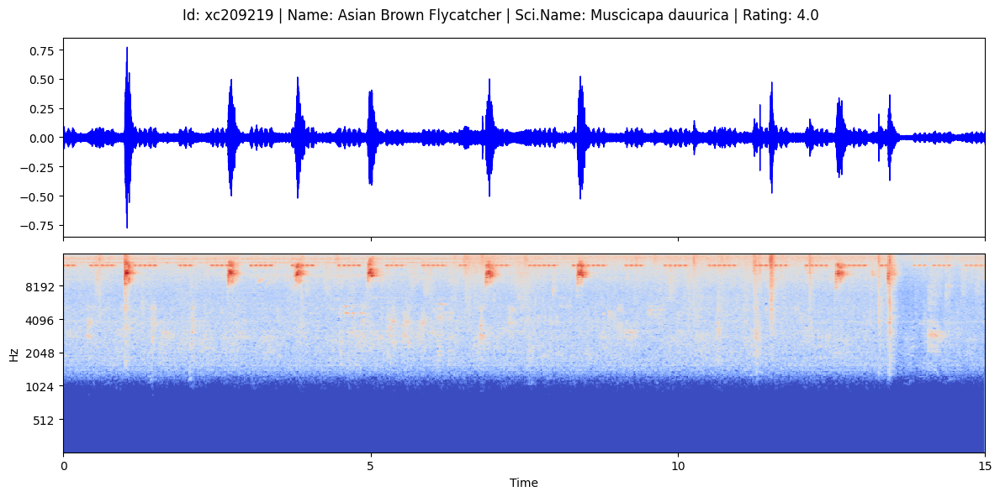

In [32]:
row = df.iloc[35]

# Display audio
# display_audio(row)
display_audio(wav_file)

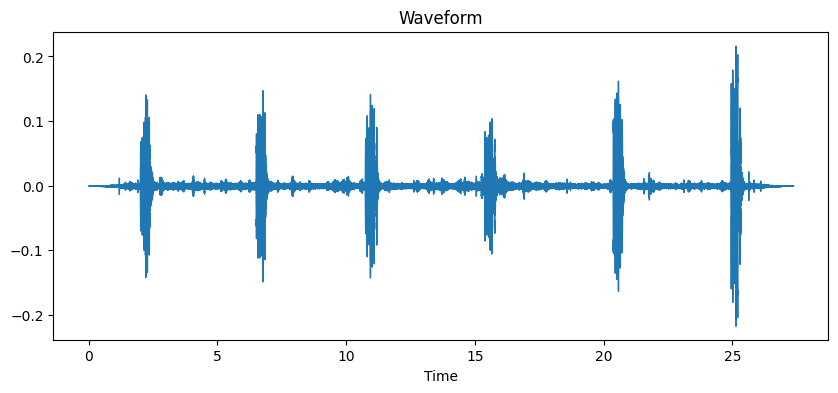

In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt

# Load the converted .wav file
y, sr = librosa.load(wav_file, sr=None)

# Display the waveform
plt.figure(figsize=(10, 4))
librosa.display.waveshow(y, sr=sr)
plt.title('Waveform')
plt.show()


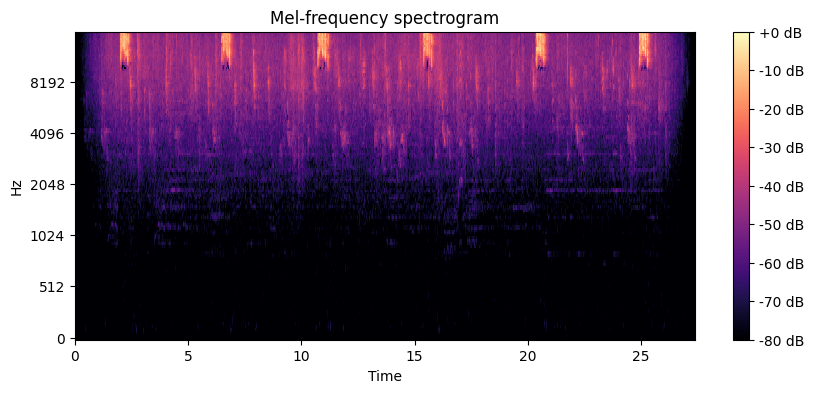

In [ ]:
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt

# Convert to Mel Spectrogram
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000)
S_dB = librosa.power_to_db(S, ref=np.max)

# Display the Mel Spectrogram
plt.figure(figsize=(10, 4))
librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel-frequency spectrogram')
plt.show()


In [ ]:
# Time Stretching
y_stretched = librosa.effects.time_stretch(y, rate=1.2)

# Pitch Shifting
y_shifted = librosa.effects.pitch_shift(y, sr=sr, n_steps=4)


In [ ]:
import os
import numpy as np
import librosa

X = []
y = []

# Define the directory containing the audio files
audio_dir = '/content/birdclef_data/train_audio/asbfly'

# Create a list of all .ogg files in the directory
audio_files = [os.path.join(audio_dir, file) for file in os.listdir(audio_dir) if file.endswith('.ogg')]

# Loop through audio_files
for file in audio_files:
    y_audio, sr = librosa.load(file, sr=None)
    mfccs = librosa.feature.mfcc(y=y_audio, sr=sr, n_mfcc=13)
    feature_vector = np.mean(mfccs.T, axis=0)
    X.append(feature_vector)

    # Extract the species name from the file path (assuming species are in the folder names)
    label = os.path.basename(os.path.dirname(file))

    # Append the label using np.append
    y = np.append(y, label)

# Convert X to a NumPy array if not already
X = np.array(X)


In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

# Initialize the model
model = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
model.fit(X_train, y_train)

# Predict on the validation set
y_val_pred = model.predict(X_val)

# Evaluate the model
accuracy = accuracy_score(y_val, y_val_pred)
print(f"Validation Accuracy: {accuracy}")
print(classification_report(y_val, y_val_pred))


Validation Accuracy: 1.0
              precision    recall  f1-score   support

      asbfly       1.00      1.00      1.00        17

    accuracy                           1.00        17
   macro avg       1.00      1.00      1.00        17
weighted avg       1.00      1.00      1.00        17



In [ ]:
# Train on the full training set
model.fit(X_train, y_train)

# Predict on the test set
y_test_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Accuracy: {accuracy}")
print(classification_report(y_test, y_test_pred))


Test Accuracy: 1.0
              precision    recall  f1-score   support

      asbfly       1.00      1.00      1.00        21

    accuracy                           1.00        21
   macro avg       1.00      1.00      1.00        21
weighted avg       1.00      1.00      1.00        21

